# The Elephant Random Walk

Based on [Schütz and Trimper 2008](https://arxiv.org/pdf/cond-mat/0406593.pdf). 



In [1]:
using Plots
p0 = 0.5
rad(u) = 2*(rand()<u) - 1 # rademacher random variable


rad (generic function with 1 method)

In [2]:
function erw_step!(s, i, p)
    mem = rand(1:i-1)
    s[i] = rad(p) * s[mem]
end

function erw(N, p, p0=p0)
    s = zeros(N);
    s[1] = rad(p0)
    for i in 2:N
        erw_step!(s,i,p)
    end
    return cumsum(s)
end

erw (generic function with 2 methods)

In [3]:
function create_steps(pmin=0.5, step=0.01, pmax = 0.9)
    """
    Utility for creating steps with varying memory and suitable indexation
    """
    p_list = pmin:step:pmax
    I(x) = (x - pmin)/(pmax - pmin)
    return p_list, I
end

cmap=cgrad(:coolwarm, rev = true)


In [58]:
p_list, I = create_steps()

N=1000
N_trials = 50
W = Dict()
pl=plot(title="elephant random walk", background_color=:black)
for _p in p_list
    W[_p] = zeros(N_trials, N)
    for trial in 1:N_trials
        W[_p][trial, :] = erw(N,_p)
        plot!(pl, W[_p][trial, :], label=:none, color=cmap[I(_p)], alpha=0.2)
    end
    #plot!(pl, sum(W[_p], dims=1)/N_trials, label="p=$_p", color=cmap[I(_p)], lw=2, alpha = 0.5)
end
#display(pl)


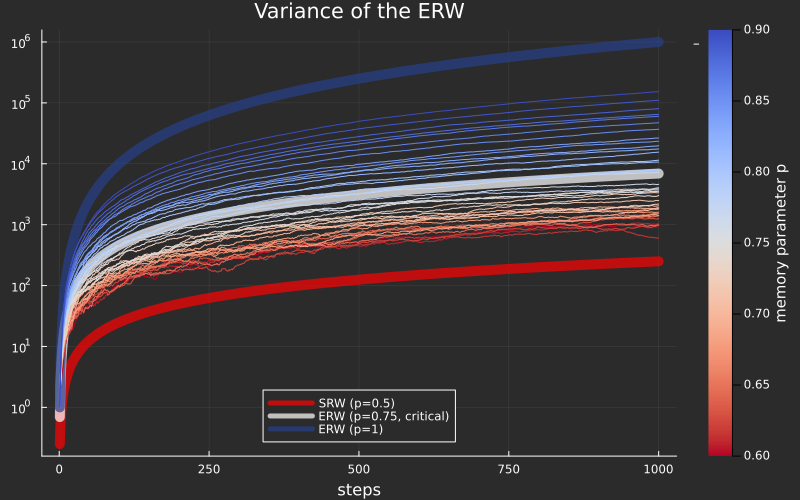

GKS: Rectangle definition is invalid in routine SET_VIEWPORT
GKS: Rectangle definition is invalid in routine SET_VIEWPORT
GKS: Rectangle definition is invalid in routine SET_VIEWPORT
GKS: Rectangle definition is invalid in routine SET_VIEWPORT
GKS: Rectangle definition is invalid in routine SET_VIEWPORT


"/home/simon/Documents/SimonCoste.github.io/posts/img/erw_variance.png"

In [69]:
pl2=plot(background_color=:grey17, title="Variance of the ERW", yaxis=:log, legend=:bottom, xlabel="steps")
u = 1:N

u = 1:N
fat = 10
plot!(pl2, u/4, label="SRW (p=0.5)", lw=fat, color=:red, alpha=0.7)
plot!(pl2, u.*log.(1 .+u), label="ERW (p=0.75, critical)", lw=fat, color=:white, alpha=0.7)
plot!(pl2, u.^2, label="ERW (p=1)", lw=fat, color=:royalblue4, alpha=0.7)
for _p in p_list
    st = sum(W[_p].^2/N_trials, dims=1)[1,:]
    plot!(pl2, st, label=:none, color=cmap[I(_p)])
end
plc = heatmap(rand(2,2), clims=(0.6,0.9), framestyle=:none, c=cmap, cbar=true, lims=(-1,0), colorbar_title="memory parameter p")
l = @layout [a{0.95w} b]
fpl = plot(pl2, plc, layout=l, size=(800,500))
display(fpl)
savefig("erw_var.png")
savefig("~/Documents/SimonCoste.github.io/posts/img/erw_variance.png")

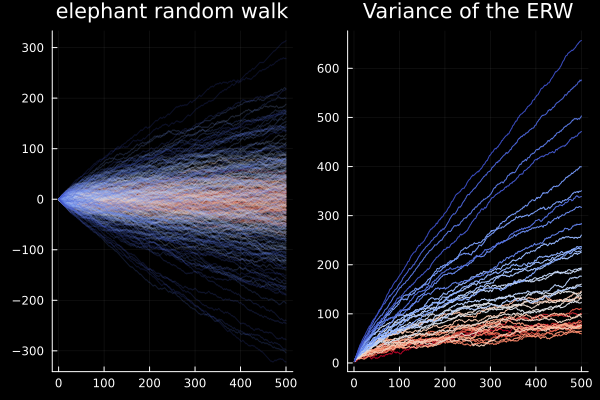

In [6]:
plot(pl, pl2)

In [26]:
p_list_2 = [0.5, 0.6, 0.75, 0.8]
N=500
N_trials=5000
plot_list = []
hist_list = []
W2 = Dict()
for _p in p_list_2
    x = zeros(N,N_trials)
    for trial in 1:N_trials
        x[:,trial] = erw(N,_p)
    end
    W2[_p] = x
    pl = plot(ylims=(-N/2,N/2), title="p=$_p")
    plot!(pl, 1:500, W2[_p][:,1:200], legend=:none, color=:darkgreen, alpha=0.1)

    hi = plot(yaxis=false, xlims=(-N/2,N/2))
    histogram!(hi,W2[_p][end, :], nbins=100, legend=:none, color=:darkgreen, linecolor=:darkgreen)
    push!(plot_list, pl)
    push!(hist_list, hi)
end
#display(hist_list[1])

In [30]:
plot(plot_list..., hist_list..., layout=(2,4), size=(1000,500))
savefig("erw.png")
savefig("~/Documents/SimonCoste.github.io/posts/img/erw.png")


"/home/simon/Documents/SimonCoste.github.io/posts/img/erw.png"